# Weather Analytics - DS4A / Team 79

### Developed by:
###  Camilo Quiroga, Luis Dominguez, Leonardo Ramirez, Manuel Serrano, Daniel Mariño, Pascual Ferrans
    
***
    
### Description:

Este Notebook tiene como objetivo analizar el comportamiento meteorológico de los aeropuertos más importantes de Colombia, teniendo en cuenta la información meteorológica suministrada por
<a href="https://mesonet.agron.iastate.edu/ASOS/">IOWA State University - MESONET</a>. 

### Motivation:

#### Aerolineas: 

* Mitigar demoras causadas por meteorologia, evitando que hayan vuelos en instantes del tiempo en donde existe una probabilidad alta de que se generen condiciones adversas de meteorología como visibilidad reducida o Truenos, garantizando altos estandares de puntualidad.


* Reducir el consumo de combustible, evitando que un avión vuele hacia un destino en donde se prevee que hay condiciones adversas de meteorología que pueden restingir la operación de un aeropuerto (Cierre de Aeropuerto). Al cerrarse un aeropuerto, un avión puede permanecer un tiempo en el aire mientras que el aeropuerto regresa a condiciones normales, sin embargo esto genera un consumo adicional de combustible. En caso de que el aeropuerto no mejore sus condiciones, el avión deberá dirigirse a un aeropuerto alterno.

#### Aeropuertos: 

* Cuando existen condiciones meteorologicas adversas, los aeropuertos se saturan. Por lo tanto es relevante hacer una gestión adecuada de la meteorología con el fin de planificar con eficiencia y seguridad el desarrollo de todos los procesos que tienen lugar en el aeropuerto.



### Impact:

* Está metodología se puede extender a cualquier aeropuerto y aerolinea del mundo.


In [24]:
import warnings; warnings.simplefilter('ignore')
import os, shutil, datetime
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import folium 
import seaborn as sns

from sklearn.cluster import KMeans

pd.set_option('display.max_columns', None)
%matplotlib inline

### 0. Parameters

* **Countries (dictionary):** Airport list to analize (IATA Format). 
* **Years (integer):** Amount of historical years to extract weather data

In [25]:
Countries={'CO':['ADZ','BAQ','BOG','BGA','CLO','CTG','CUC','LET','MDE','MTR','PEI','RCH','SMR','VUP']} 
Years=5

### 1. Data

* <a href="https://ourairports.com/data/">Airports data</a>
* <a href="https://mesonet.agron.iastate.edu/ASOS/">IOWA State University - MESONET / Weather historical data</a>
* Minimum requirements of visibility per airport

In [26]:
#Airports Data Frame // Get data from airports to analyze

#Read csv file from ourairports.com and select specific info 
#(Latitude, longitude, elevation, country, municipality, gpscode (OACI Code))

airports=pd.read_csv("http://ourairports.com/data/airports.csv")
airports=airports[(airports["scheduled_service"]=='yes') & (airports["type"].str.contains("medium") | airports["type"].str.contains("large"))]
airports.drop(["id", "ident", "iso_region","continent","type","scheduled_service","local_code","home_link","wikipedia_link","keywords"],axis=1,inplace=True)

#Filter Airports to analyze
request=[]
for i in Countries:
    for j in Countries.get(i):
        request.append(j)
        
airports=airports[airports['iata_code'].isin(request)]
airports.set_index("iata_code",inplace=True)

#Classify airports type according their information using K-means

kmeans = KMeans(n_clusters=3, random_state=0).fit(airports.iloc[:,1:4])
airports['Airport Type']=kmeans.labels_

airports.head()

,name,latitude_deg,longitude_deg,elevation_ft,iso_country,municipality,gps_code,Airport Type
iata_code,,,,,,,,
BGA,Palonegro Airport,7.12650,-73.1848,3897.0,CO,Bucaramanga,SKBG,2
BOG,El Dorado International Airport,4.70159,-74.1469,8361.0,CO,Bogota,SKBO,1
BAQ,Ernesto Cortissoz International Airport,10.88960,-74.7808,98.0,CO,Barranquilla,SKBQ,0
CUC,Camilo Daza International Airport,7.92757,-72.5115,1096.0,CO,Cúcuta,SKCC,0
CTG,Rafael Nuñez International Airport,10.44240,-75.5130,4.0,CO,Cartagena,SKCG,0


In [27]:
# Read minimum requirements of visibility per airport
minimos=pd.read_csv("Minimos requeridos Aeropuertos COL.csv",sep=';')
minimos.set_index('IATA',inplace=True)
minimos=minimos.iloc[:,:-1]
minimos.head()

,H Vsby (miles),V Vsby (ft)
IATA,,
ADZ,1.43,500
BAQ,0.62,200
BOG,0.50,220
BGA,0.81,300
CLO,0.50,283


In [28]:
#Get data from IOWA State University - Mesonet, generating a link with the variables and airports info to download

def getdata(stationslist,year=Years,df=airports,adjUTC=-5,Last24h=False,link=True):
    
    #stationslist: Request of airports to download (Dictionary)
    #year:Amount of historical years to extract weather data
    #df: Airports data frame
    #adjUTC: Integer to adjust to Universal Time (UTC) to Local Time
    #Last24h: Download only last 24h
    
    url="https://mesonet.agron.iastate.edu/cgi-bin/request/asos.py?"
    
    #Add request of airports to download
    for i in stationslist:
        url=url+"station="+str(df.at[i,'gps_code'])+"&"
    
    #Add Weather variables to download
    #Temperauture (°C)//Wind Speed (Knots)//Visibility (miles)
    #Cloud Coverage//Cloud Height Level (ft)//Present Wx Codes
    
    url=url+"data=tmpc&data=sknt&data=vsby&data=skyl1&data=wxcodes"
    
    #Define the period of time to download
   
    if Last24h==True:
        #Dowload the last 24h
        
        date1=datetime.datetime.utcnow().date() - datetime.timedelta(days=1)
        date2=datetime.datetime.utcnow().date() + datetime.timedelta(days=1)

        y1=str(date1.year)
        m1=str(date1.month)
        d1=str(date1.day)

        y2=str(date2.year)
        m2=str(date2.month)
        d2=str(date2.day)
    
        #Date from-to
        url=url+"&year1="+y1+"&month1="+m1+"&day1="+d1+"&year2="+y2+"&month2="+m2+"&day2="+d2
    
    else:
        #Download historical data according the amount of years
        date2=datetime.datetime.utcnow().date() - datetime.timedelta(days=1)
        y2=str(date2.year)
        m2=str(date2.month)
        d2=str(date2.day)
        y1=str(date2.year-year)

        #Date from-to
        url=url+"&year1="+y1+"&month1=1&day1=1&year2="+y2+"&month2="+m2+"&day2="+d2
    
    #Missing values as null, download directly as txt file    
    url=url+"&tz=Etc%2FUTC&format=onlycomma&latlon=no&missing=null&trace=null&direct=yes&report_type=1&report_type=2"
    
    #Link to download data
    if link==True:
        print("Link:\n\n"+url)
    
    data=pd.read_csv(url)
    
    #Define time variables, adjust variables to local time (Colombia UTC-5)
    data["valid"]=pd.to_datetime(data["valid"])
    data["Year"]= pd.DatetimeIndex(data["valid"]).year
    data["Month"]= pd.DatetimeIndex(data["valid"]).month
    data["Day"]= pd.DatetimeIndex(data["valid"]+datetime.timedelta(hours=adjUTC)).day
    data["Hour"]= pd.DatetimeIndex(data["valid"]+datetime.timedelta(hours=adjUTC)).hour
    data["valid"]=pd.DatetimeIndex(data["valid"]+datetime.timedelta(hours=adjUTC))
    
    #Generate a Boolean 100 if a meteorological phenomenon occurs 0 Otherwise
    data["Rain"]=data['wxcodes'].str.contains('RA').fillna(False).astype(int)*100
    data["Fog-Brume"]=(data['wxcodes'].str.contains('FG')|data['wxcodes'].str.contains('BR')|(data['wxcodes'].str.contains('HZ'))).fillna(False).astype(int)*100
    data["Thunder"]=data['wxcodes'].str.contains('TS').fillna(False).astype(int)*100
    
    #Generate a Boolean 100 if a Fog-Brume or Thunder occur 0 Otherwise
    #Fog-Brume and Thunders restrict the operation
    data["Op constraint"]=((data["Fog-Brume"]==100) | (data["Thunder"]==100)).astype(int)*100
    
    #Organize columns of data
    data.rename(columns={"station":"OACI","tmpc": "Temperature","vsby":"H Vsby","skyl1":"V Vsby","sknt": "Wind"},inplace=True)   
    df2=df['gps_code'].to_frame().reset_index()
    data=pd.merge(left=data, right=df2, how='left', left_on='OACI', right_on='gps_code')
    data.rename(columns={"iata_code":"IATA","valid":"Date"},inplace=True)    
    data=data[['IATA','OACI',"Date",'Year','Month','Day', 'Hour', 'H Vsby', 'V Vsby','Temperature', 
               'Wind', 'Rain', 'Fog-Brume', 'Thunder','Op constraint']]
    data.sort_values(by=['IATA','Year','Month','Day', 'Hour'],inplace=True)
    data.reset_index(drop=True,inplace=True)
    
    #Data Imputation / If a null value exists replace with historical mean value of variable in the airport
    data['H Vsby'] = data[['IATA','H Vsby']].groupby("IATA").transform(lambda x: x.fillna(x.mean()))
    data['V Vsby'] = data[['IATA','V Vsby']].groupby("IATA").transform(lambda x: x.fillna(x.mean()))
    data['Temperature'] = data[['IATA','Temperature']].groupby("IATA").transform(lambda x: x.fillna(x.mean()))
    data['Wind'] = data[['IATA','Wind']].groupby("IATA").transform(lambda x: x.fillna(x.mean()))
    
    #Drop outliers according to references values
    data=data[(data['H Vsby']<=6.21) & (data['Wind']<=30)&(data['Temperature']>=-5)&(data['Temperature']<=50)&(data['V Vsby']<5000)]
    
    #Check missing data
    missing_data = data.isnull()

    if len(data.columns[data.isnull().any()].tolist())==0:
        print("\nData without null values")
    else:
        print("\nData with null values")
        for column in data.columns[data.isnull().any()].tolist():
            print (missing_data[column].value_counts())
    
    return data
    

In [29]:
#Data request historical data
data=getdata(stationslist=request,year=Years,df=airports,adjUTC=-5,Last24h=False,link=True)
data.head()

Link:

https://mesonet.agron.iastate.edu/cgi-bin/request/asos.py?station=SKSP&station=SKBQ&station=SKBO&station=SKBG&station=SKCL&station=SKCG&station=SKCC&station=SKLT&station=SKRG&station=SKMR&station=SKPE&station=SKRH&station=SKSM&station=SKVP&data=tmpc&data=sknt&data=vsby&data=skyl1&data=wxcodes&year1=2015&month1=1&day1=1&year2=2020&month2=11&day2=6&tz=Etc%2FUTC&format=onlycomma&latlon=no&missing=null&trace=null&direct=yes&report_type=1&report_type=2

Data without null values


,IATA,OACI,Date,Year,Month,Day,Hour,H Vsby,V Vsby,Temperature,Wind,Rain,Fog-Brume,Thunder,Op constraint
0,ADZ,SKSP,2015-01-01 00:00:00,2015,1,1,0,6.21,1700.0,27.0,9.0,0,0,0,0
1,ADZ,SKSP,2015-01-01 01:00:00,2015,1,1,1,6.21,1700.0,27.0,9.0,0,0,0,0
2,ADZ,SKSP,2015-01-01 02:00:00,2015,1,1,2,6.21,1700.0,27.0,8.0,0,0,0,0
3,ADZ,SKSP,2015-01-01 03:00:00,2015,1,1,3,6.21,1700.0,27.0,8.0,0,0,0,0
4,ADZ,SKSP,2015-01-01 04:00:00,2015,1,1,4,6.21,1700.0,27.0,8.0,0,0,0,0


In [30]:
data.shape

(604931, 15)

In [31]:
#Data request last 24h
data24h=getdata(stationslist=request,df=airports,Last24h=True,link=False)
data24h.head()


Data without null values


,IATA,OACI,Date,Year,Month,Day,Hour,H Vsby,V Vsby,Temperature,Wind,Rain,Fog-Brume,Thunder,Op constraint
0,ADZ,SKSP,2020-11-05 19:00:00,2020,11,5,19,6.21,1400.0,28.0,4.0,0,0,0,0
1,ADZ,SKSP,2020-11-05 20:00:00,2020,11,5,20,6.21,1400.0,28.0,3.0,0,0,0,0
2,ADZ,SKSP,2020-11-05 21:00:00,2020,11,5,21,6.21,1400.0,27.0,3.0,0,0,0,0
3,ADZ,SKSP,2020-11-05 22:00:00,2020,11,5,22,6.21,1400.0,27.0,2.0,0,0,0,0
4,ADZ,SKSP,2020-11-05 23:00:00,2020,11,5,23,6.21,1400.0,27.0,2.0,0,0,0,0


In [32]:
#Make dataframes with the % of occurrence of the phenomenon
dataframes={}
group={}
columns=['H Vsby','V Vsby','Temperature','Wind','Rain','Fog-Brume','Thunder','Op constraint']
hour=['Hour']

cont=0
for i in request:
    for j in hour:
        for k in columns:
            dataframes[(i,j,k)]=data[['IATA','Month',j,k]][data[['IATA','Month',j,k]]['IATA']==i]
            group[(i,j,k)]= round(dataframes.get((i,j,k)).groupby(['Month',j]).mean().unstack().fillna(0).T,0)
            
            #Make a dataframe with the detail % Fog Occurrence
            if k=='Fog-Brume':
                if cont==0:
                    Fog=round(dataframes[(i,j,k)].groupby(['IATA','Month',j]).mean().reset_index(),0)
                    cont+=1
                else:
                    Fog=pd.concat([Fog,round(dataframes[(i,j,k)].groupby(['IATA','Month',j]).mean().reset_index(),0)])

Fog=Fog.reset_index(drop=True)
Fog.rename(columns={'Fog-Brume':'% Fog Occurrence'}, inplace=True)

In [33]:
#Merge historical visibility information with Airport Type and minimun requirements per airport
data=pd.merge(data,Fog,how='left',on=['IATA','Month','Hour'])
data=pd.merge(data,airports['Airport Type'],how='left',left_on=['IATA'],right_index=True)
data=pd.merge(data,minimos,how="left",left_on=['IATA'],right_index=True)

#Airport Type Dummies
data=pd.concat([data,pd.get_dummies(data['Airport Type'],prefix="Airport Type")],axis=1)
data.drop(columns=['Airport Type'],inplace=True)

#Boolean variable if an airport has a level of visibility greather that requirement
data['Avaliable H Vsby']=data['H Vsby']-data['H Vsby (miles)']
data['Avaliable H Vsby']=[1 if x>0 else 0 for x in data['Avaliable H Vsby']]

data['Avaliable V Vsby']=data['V Vsby']-data['V Vsby (ft)']
data['Avaliable V Vsby']=[1 if x>0 else 0 for x in data['Avaliable V Vsby']]

data.head()

,IATA,OACI,Date,Year,Month,Day,Hour,H Vsby,V Vsby,Temperature,Wind,Rain,Fog-Brume,Thunder,Op constraint,% Fog Occurrence,H Vsby (miles),V Vsby (ft),Airport Type_0,Airport Type_1,Airport Type_2,Avaliable H Vsby,Avaliable V Vsby
0,ADZ,SKSP,2015-01-01 00:00:00,2015,1,1,0,6.21,1700.0,27.0,9.0,0,0,0,0,0.0,1.43,500,1,0,0,1,1
1,ADZ,SKSP,2015-01-01 01:00:00,2015,1,1,1,6.21,1700.0,27.0,9.0,0,0,0,0,1.0,1.43,500,1,0,0,1,1
2,ADZ,SKSP,2015-01-01 02:00:00,2015,1,1,2,6.21,1700.0,27.0,8.0,0,0,0,0,0.0,1.43,500,1,0,0,1,1
3,ADZ,SKSP,2015-01-01 03:00:00,2015,1,1,3,6.21,1700.0,27.0,8.0,0,0,0,0,0.0,1.43,500,1,0,0,1,1
4,ADZ,SKSP,2015-01-01 04:00:00,2015,1,1,4,6.21,1700.0,27.0,8.0,0,0,0,0,0.0,1.43,500,1,0,0,1,1


In [34]:
#shift columns with weather variables to check the time series behavior
columns=['IATA','H Vsby','V Vsby','Temperature','Wind']
t=3

for j in range(1,t+1):
    for i in columns:
        data[i+" t-"+str(j)]=data[i].shift(j)
    
    data=data[data['IATA']==data['IATA t-'+str(j)]]
    data.drop(columns=['IATA t-'+str(j)],inplace=True)

data.reset_index(drop=True,inplace=True)
data.head()      

,IATA,OACI,Date,Year,Month,Day,Hour,H Vsby,V Vsby,Temperature,Wind,Rain,Fog-Brume,Thunder,Op constraint,% Fog Occurrence,H Vsby (miles),V Vsby (ft),Airport Type_0,Airport Type_1,Airport Type_2,Avaliable H Vsby,Avaliable V Vsby,H Vsby t-1,V Vsby t-1,Temperature t-1,Wind t-1,H Vsby t-2,V Vsby t-2,Temperature t-2,Wind t-2,H Vsby t-3,V Vsby t-3,Temperature t-3,Wind t-3
0,ADZ,SKSP,2015-01-01 07:00:00,2015,1,1,7,6.21,1700.0,27.0,9.0,0,0,0,0,1.0,1.43,500,1,0,0,1,1,6.21,1700.0,27.0,9.0,6.21,1700.0,27.0,8.0,6.21,1700.0,27.0,8.0
1,ADZ,SKSP,2015-01-01 08:00:00,2015,1,1,8,6.21,1700.0,28.0,8.0,0,0,0,0,0.0,1.43,500,1,0,0,1,1,6.21,1700.0,27.0,9.0,6.21,1700.0,27.0,9.0,6.21,1700.0,27.0,8.0
2,ADZ,SKSP,2015-01-01 09:00:00,2015,1,1,9,6.21,1700.0,28.0,10.0,0,0,0,0,0.0,1.43,500,1,0,0,1,1,6.21,1700.0,28.0,8.0,6.21,1700.0,27.0,9.0,6.21,1700.0,27.0,9.0
3,ADZ,SKSP,2015-01-01 10:00:00,2015,1,1,10,6.21,1700.0,29.0,11.0,0,0,0,0,0.0,1.43,500,1,0,0,1,1,6.21,1700.0,28.0,10.0,6.21,1700.0,28.0,8.0,6.21,1700.0,27.0,9.0
4,ADZ,SKSP,2015-01-01 11:00:00,2015,1,1,11,6.21,1700.0,29.0,11.0,0,0,0,0,0.0,1.43,500,1,0,0,1,1,6.21,1700.0,29.0,11.0,6.21,1700.0,28.0,10.0,6.21,1700.0,28.0,8.0


In [35]:
#Check missing data
missing_data = data.isnull()

if len(data.columns[data.isnull().any()].tolist())==0:
    print("\nData without null values")
else:
    print("\nData with null values")
    for column in data.columns[data.isnull().any()].tolist():
        print (missing_data[column].value_counts())


Data without null values


In [36]:
data.to_csv("Master Data Base.csv")

### 2. Exploratory data analysis (EDA)

In [37]:
#Airports Visualization using folium, according Latitude and Longitude information

latitude=airports['latitude_deg'].median()
longitude=airports['longitude_deg'].median()
zoom=5

Airports_map = folium.Map(location = [latitude, longitude], zoom_start = zoom)

for lat, lng, label in zip(list(airports.latitude_deg),list(airports.longitude_deg),list('('+airports.index+') '+airports.municipality)):
    folium.Marker([lat, lng], popup=label).add_to(Airports_map) 

Airports_map.save(outfile= "Airports_map.html")
Airports_map

In [38]:
#Describe Request
data.describe().round(2)

,Year,Month,Day,Hour,H Vsby,V Vsby,Temperature,Wind,Rain,Fog-Brume,Thunder,Op constraint,% Fog Occurrence,H Vsby (miles),V Vsby (ft),Airport Type_0,Airport Type_1,Airport Type_2,Avaliable H Vsby,Avaliable V Vsby,H Vsby t-1,V Vsby t-1,Temperature t-1,Wind t-1,H Vsby t-2,V Vsby t-2,Temperature t-2,Wind t-2,H Vsby t-3,V Vsby t-3,Temperature t-3,Wind t-3
count,604847.00,604847.00,604847.00,604847.00,604847.00,604847.00,604847.00,604847.00,604847.00,604847.00,604847.00,604847.00,604847.00,604847.00,604847.00,604847.00,604847.00,604847.00,604847.00,604847.00,604847.00,604847.00,604847.00,604847.00,604847.00,604847.00,604847.00,604847.00,604847.00,604847.00,604847.00,604847.00
mean,2017.40,6.39,15.69,12.17,5.87,1695.11,24.91,5.75,2.33,6.34,2.03,8.33,6.37,1.07,383.45,0.60,0.18,0.22,0.99,1.00,5.87,1695.11,24.91,5.75,5.87,1695.12,24.91,5.75,5.87,1695.12,24.91,5.75
std,1.65,3.42,8.80,6.41,0.96,566.39,5.90,4.45,15.10,24.37,14.09,27.63,13.02,0.67,188.17,0.49,0.39,0.41,0.09,0.07,0.96,566.39,5.90,4.45,0.96,566.40,5.90,4.45,0.96,566.40,5.90,4.45
min,2015.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.50,200.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,2016.00,3.00,8.00,7.00,6.21,1409.23,21.00,3.00,0.00,0.00,0.00,0.00,0.00,0.50,240.00,0.00,0.00,0.00,1.00,1.00,6.21,1409.23,21.00,3.00,6.21,1409.23,21.00,3.00,6.21,1409.23,21.00,3.00
50%,2017.00,6.00,16.00,12.00,6.21,1700.00,26.00,5.00,0.00,0.00,0.00,0.00,1.00,0.81,300.00,1.00,0.00,0.00,1.00,1.00,6.21,1700.00,26.00,5.00,6.21,1700.00,26.00,5.00,6.21,1700.00,26.00,5.00
75%,2019.00,9.00,23.00,17.00,6.21,2000.00,29.00,8.00,0.00,0.00,0.00,0.00,6.00,1.55,500.00,1.00,0.00,0.00,1.00,1.00,6.21,2000.00,29.00,8.00,6.21,2000.00,29.00,8.00,6.21,2000.00,29.00,8.00
max,2020.00,12.00,31.00,23.00,6.21,4700.00,47.00,30.00,100.00,100.00,100.00,100.00,100.00,2.61,823.00,1.00,1.00,1.00,1.00,1.00,6.21,4700.00,47.00,30.00,6.21,4700.00,47.00,30.00,6.21,4700.00,47.00,30.00


In [39]:
#Directory to save main graphs
dir = os.getcwd()+"/0. Main Graphs"
if os.path.exists(dir):
    shutil.rmtree(dir)
os.makedirs(dir)

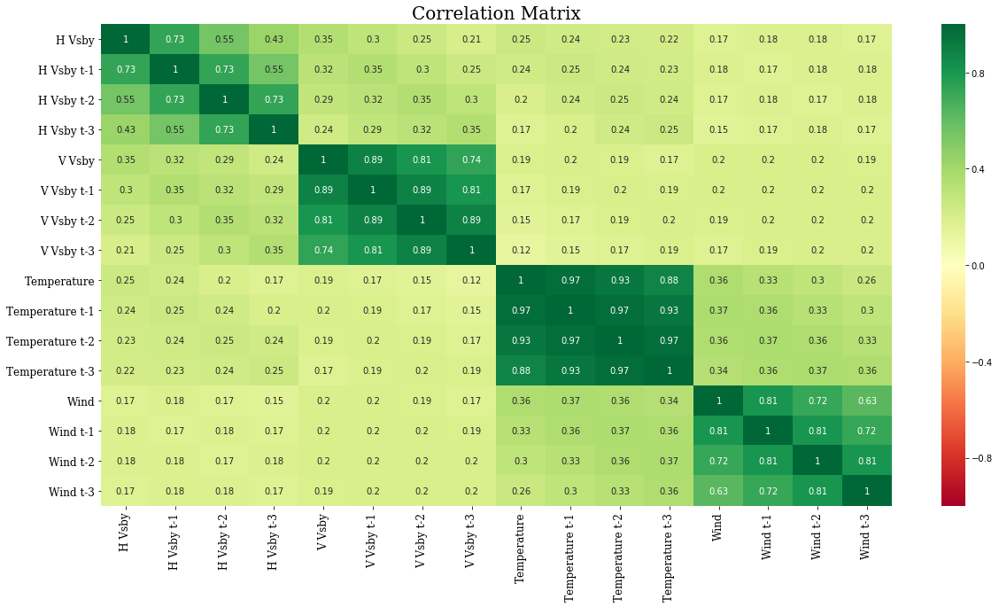

In [40]:
#Correlation Matrix to verify the time series behavior

cols=['H Vsby','H Vsby t-1','H Vsby t-2','H Vsby t-3',
      'V Vsby','V Vsby t-1','V Vsby t-2','V Vsby t-3',
      'Temperature','Temperature t-1','Temperature t-2','Temperature t-3',
      'Wind','Wind t-1', 'Wind t-2', 'Wind t-3']

fig = plt.figure(figsize=(20,10))
ax=sns.heatmap(data[cols].corr().round(2), vmin=-1,vmax=1,annot = True,cmap="RdYlGn")
plt.xticks(family="serif",fontsize=12)
plt.yticks(family="serif",fontsize=12)
ax.set_title("Correlation Matrix",family="serif",fontsize=20)
plt.savefig(os.path.join(dir, 'Correlation Matrix.png'))

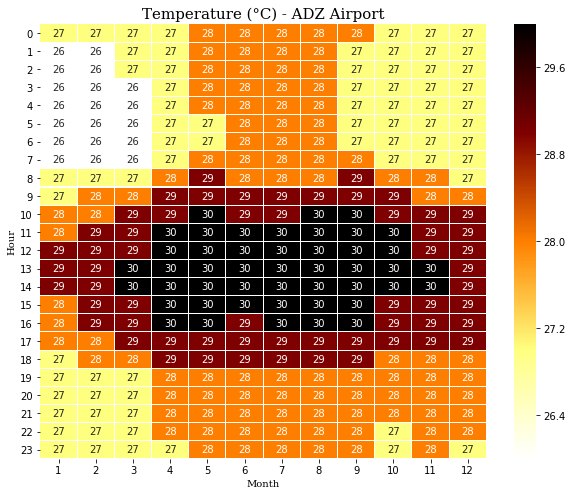

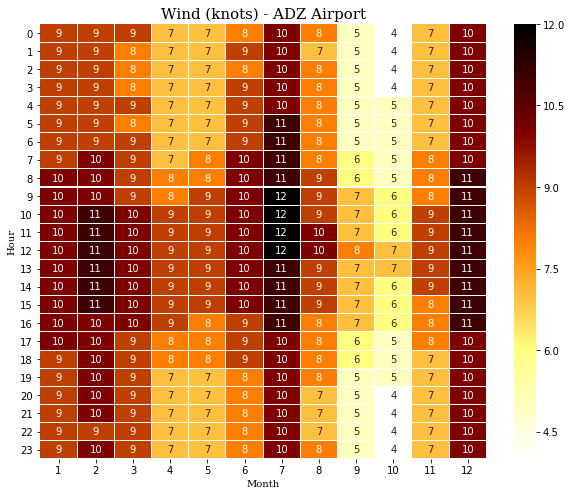

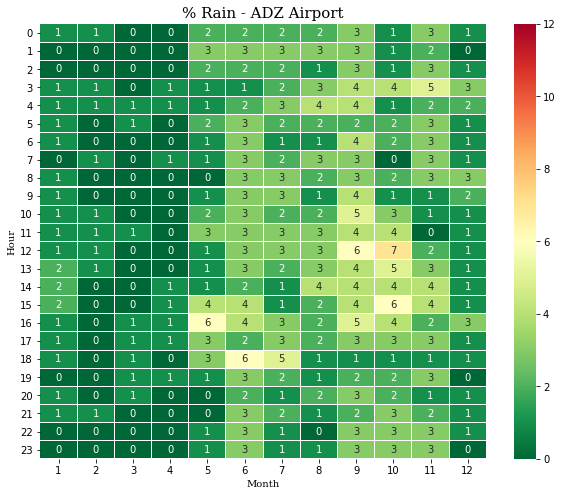

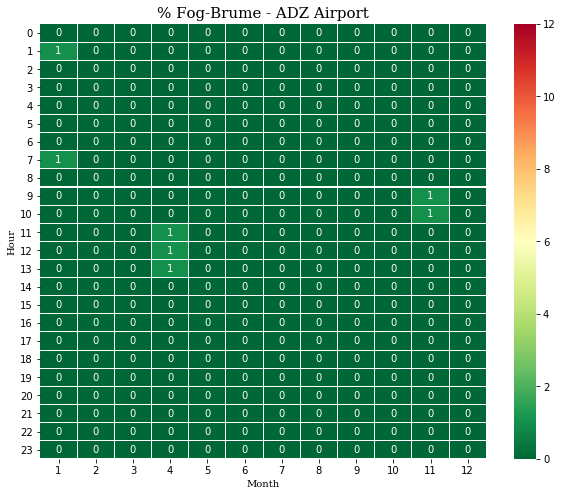

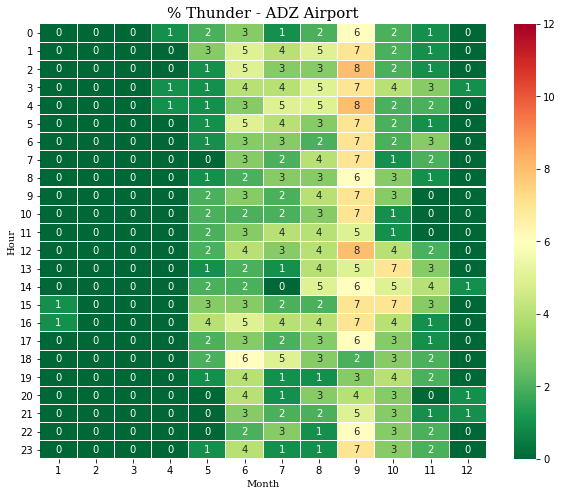

...

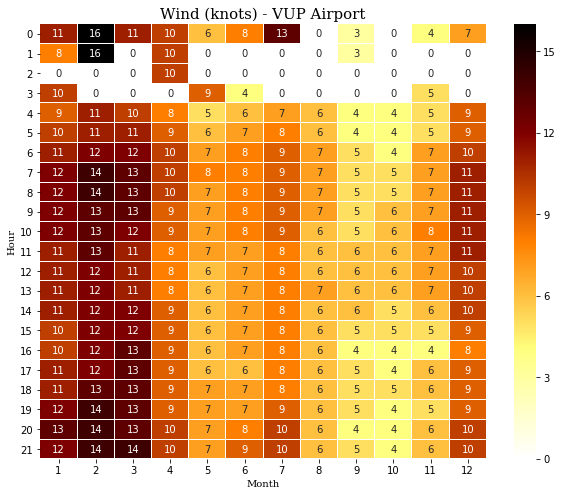

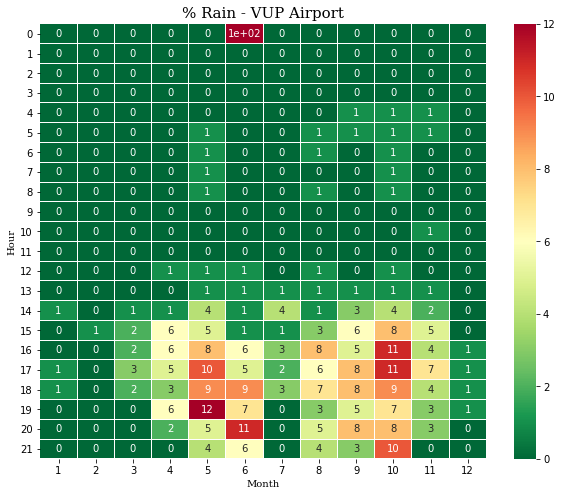

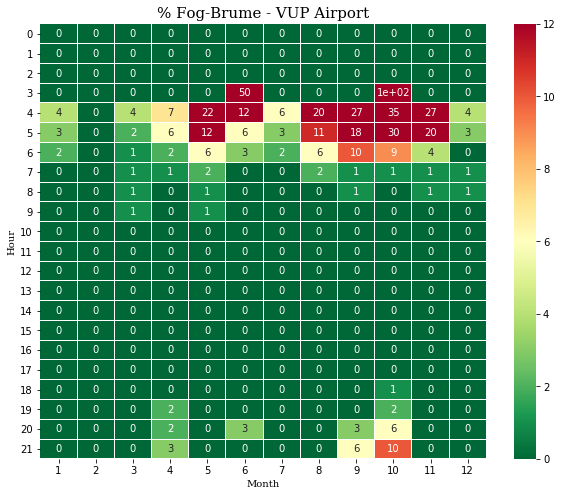

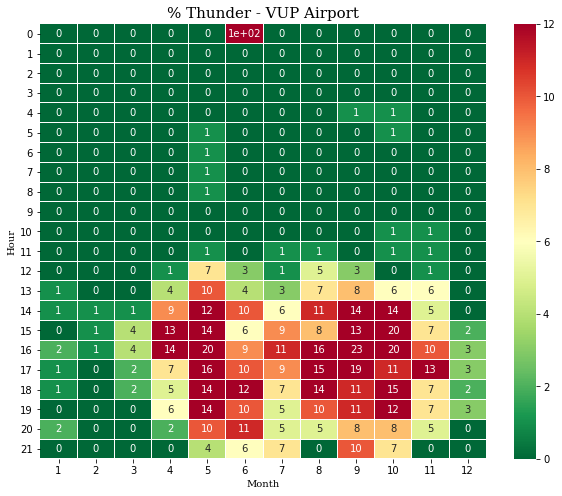

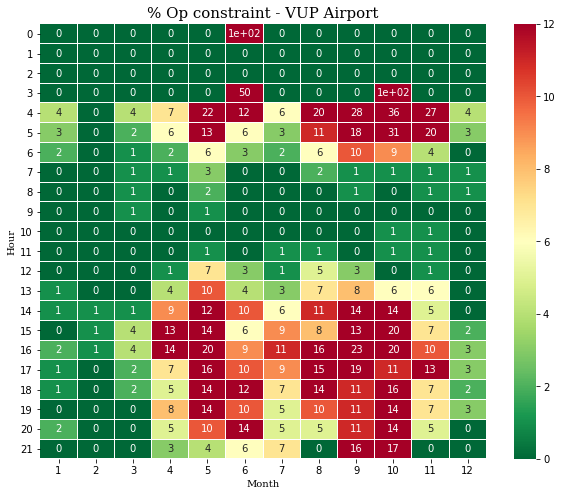

In [41]:
#Generate and Save Weather Variable Heatmaps by airport

columns=['Temperature','Wind','Rain','Fog-Brume','Thunder','Op constraint']
columns_title=['Temperature (°C)','Wind (knots)','% Rain','% Fog-Brume','% Thunder','% Op constraint']
vmin=0
vmax=12
ax={}
f={}

#Directory to save heatmaps

dir = os.getcwd()+"/1. Airport Heatmaps"
if os.path.exists(dir):
    shutil.rmtree(dir)
os.makedirs(dir)

for i in request:
    
    dir2=str(dir)+"/"+str(i)
    if os.path.exists(dir2):
        shutil.rmtree(dir2)
    os.makedirs(dir2)
    
    for j in hour:
        for k in columns:
            ax[(i,j,k)]= plt.figure(figsize=(10, 8))
            if k=="Temperature" or k=="Wind":
                #intensity heat maps
                ax[(i,j,k)]=sns.heatmap(group.get((i,j,k)),cmap="afmhot_r",annot=True,linewidths=.01)
            else:
                #Probability heat maps
                ax[(i,j,k)]=sns.heatmap(group.get((i,j,k)),vmin=vmin, vmax=vmax,cmap="RdYlGn_r",annot=True,linewidths=.01)
            
            ax[(i,j,k)].set_yticklabels(np.arange(0,24))
            ax[(i,j,k)].set_ylabel(j,fontsize=10,family="serif")
            ax[(i,j,k)].set_xlabel("Month",fontsize=10,family="serif")
            ax[(i,j,k)].set_title(columns_title[columns.index(k)]+" - "+ i +" Airport",fontsize=15,family="serif")

            my_file=columns_title[columns.index(k)]+" - "+ i +" Airport"+'.png'
            plt.savefig(os.path.join(dir2, my_file))
            plt.show()


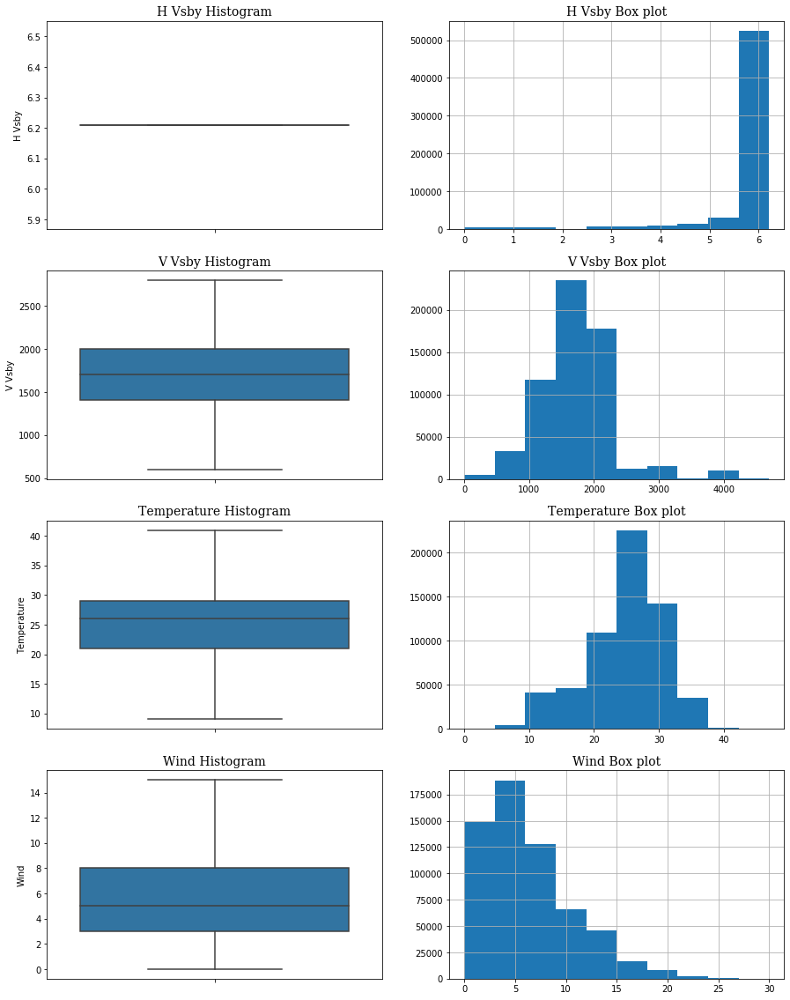

In [42]:
#Weather Variables Distribution Analysis

plt.figure(figsize=(15,20))

for j,var in enumerate(['H Vsby','V Vsby','Temperature','Wind']):
    for i,chart in enumerate(['Histogram','Box plot']):
        fig = plt.subplot(4,2,2*j+i+1)
        plt.title(var+" "+chart,family="serif",fontsize=14)
        
        if (2*j+i+1)%2==0:
            #Histogram
            data[var].hist()
        else:
            #Box-Plot
            sns.boxplot(y=var,data=data,showfliers = False)  

plt.savefig(os.path.join(dir, 'Weather Variables Distribution.png'))

In [43]:
#Directory to save graphs

dir = os.getcwd()+"/2. Airport Graphs"

if os.path.exists(dir):
    shutil.rmtree(dir)
os.makedirs(dir)

for i in request:
    
    dir2=str(dir)+"/"+str(i)
    if os.path.exists(dir2):
        shutil.rmtree(dir2)
    os.makedirs(dir2)
    
    for k,month in enumerate(['January','February','March','April','May','June','July','August','September','October','November','December']):
        
            dir3=str(dir2)+"/"+str(k)+". "+month
            if os.path.exists(dir3):
                shutil.rmtree(dir3)
            os.makedirs(dir3)
    

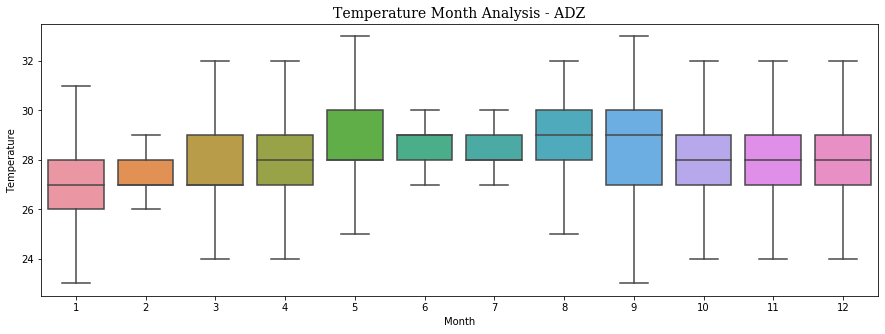

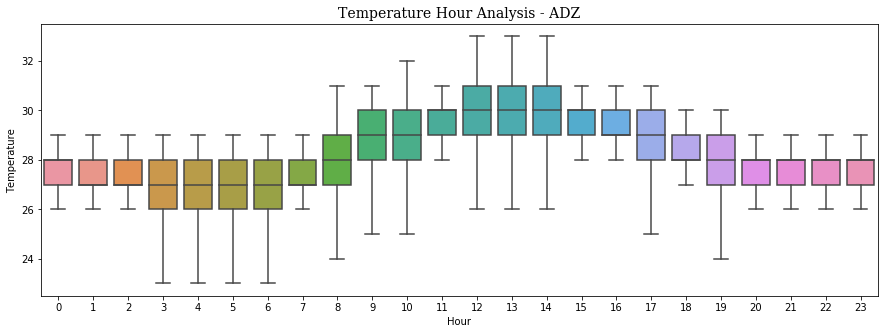

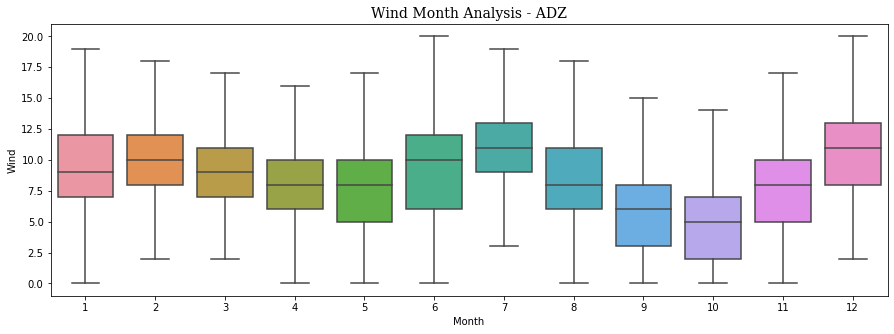

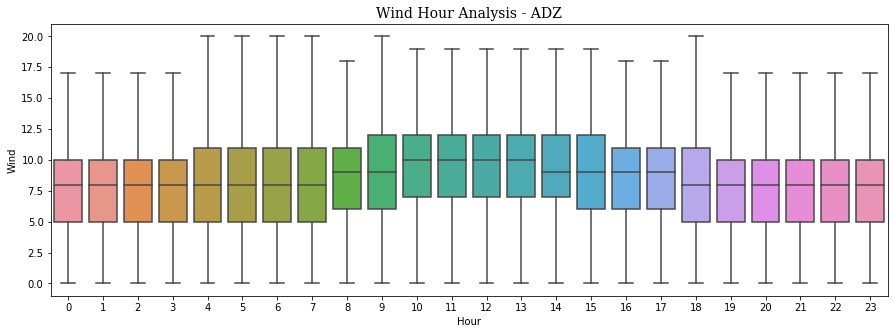

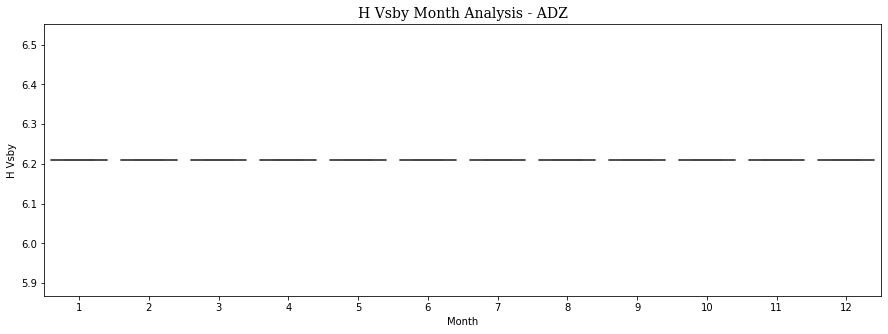

...

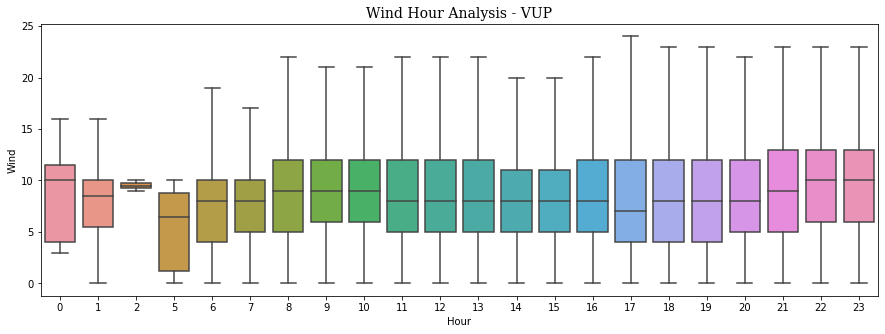

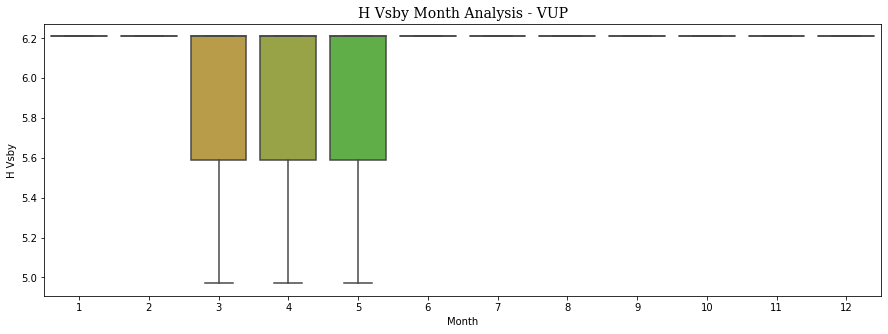

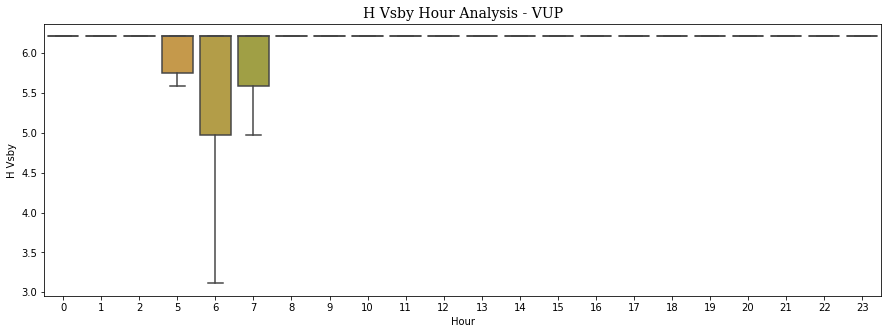

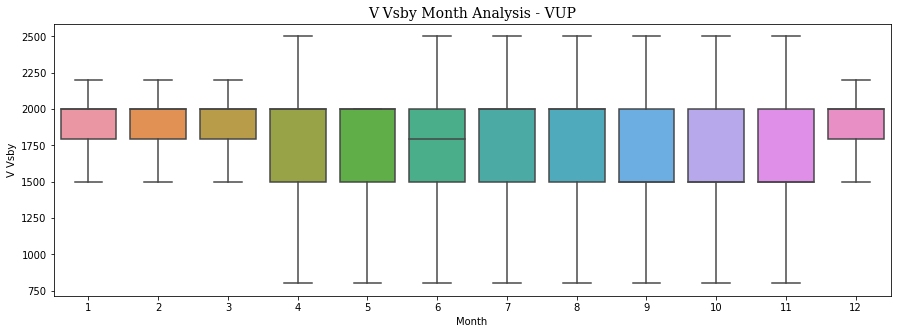

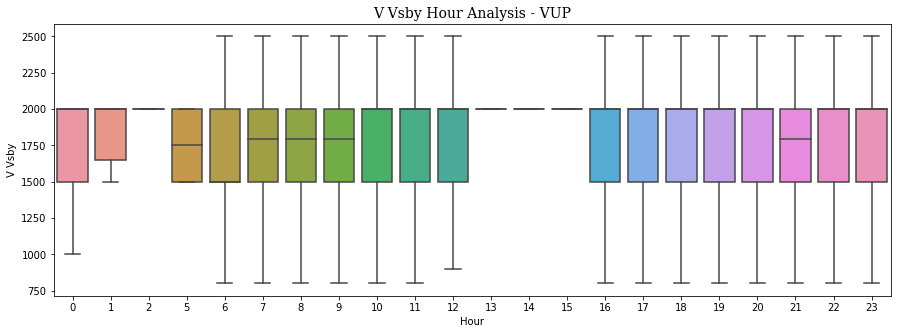

In [44]:
#Trend analysis and variability for each weather variable per Airport

for i in request:
    
    dir2=str(dir)+"/"+str(i)
    
    for j in ['Temperature','Wind','H Vsby','V Vsby',]:
        for k in ['Month','Hour']:
            
            aux=data[data['IATA']==i]
            plt.figure(figsize=(15,5))
            sns.boxplot(y=j,x=k,data=aux,showfliers = False)
            plt.title(j+' '+k+' Analysis - '+i,family="serif",fontsize=14)
            my_file=j+' '+k+' Analysis - '+i+'.png'
            plt.savefig(os.path.join(dir2, my_file))

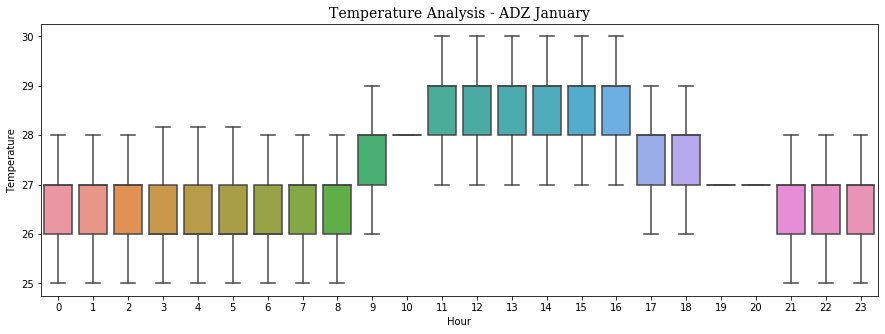

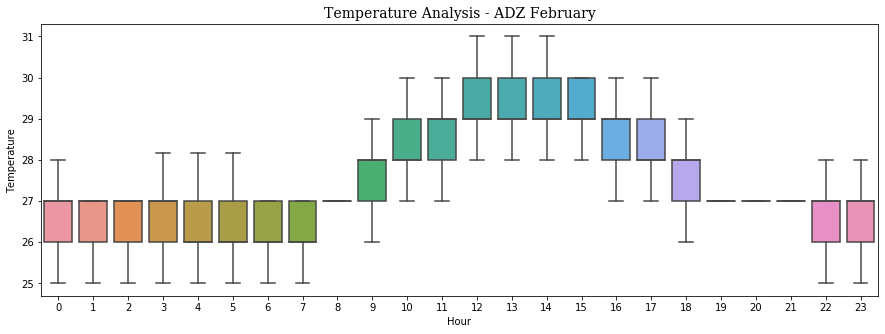

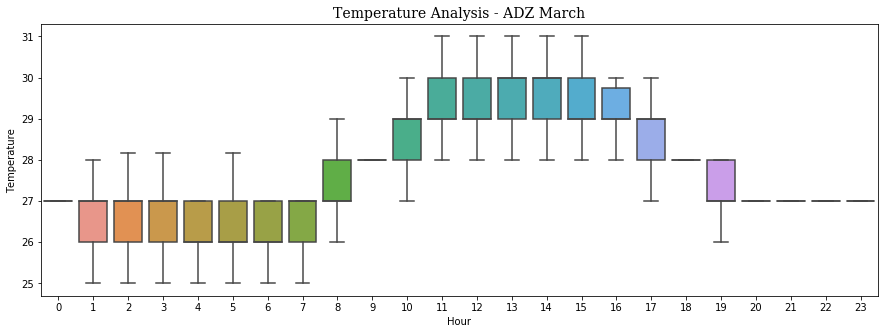

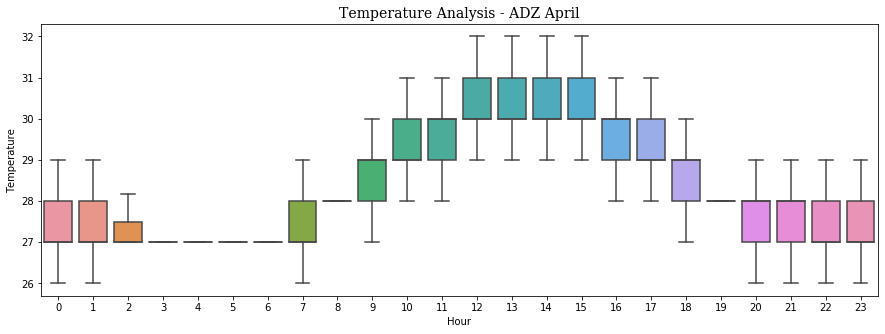

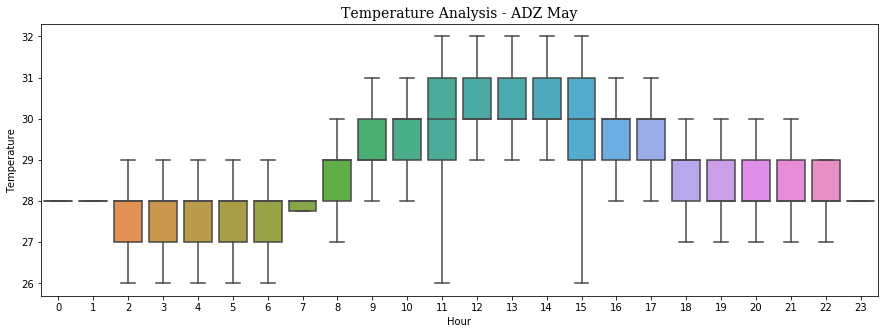

...

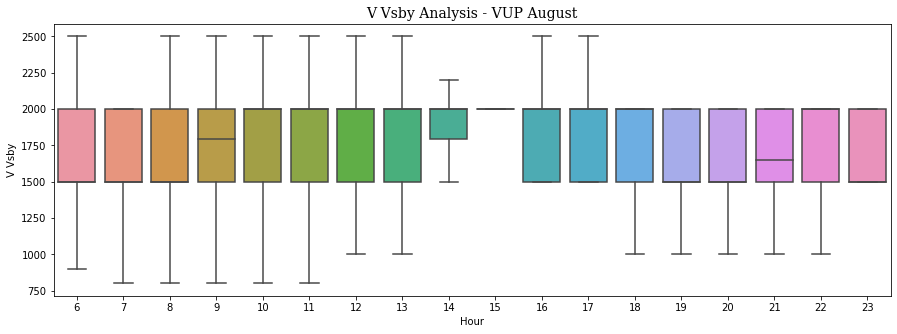

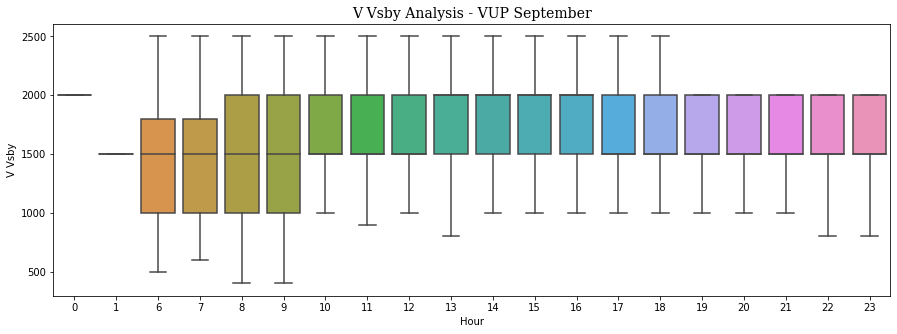

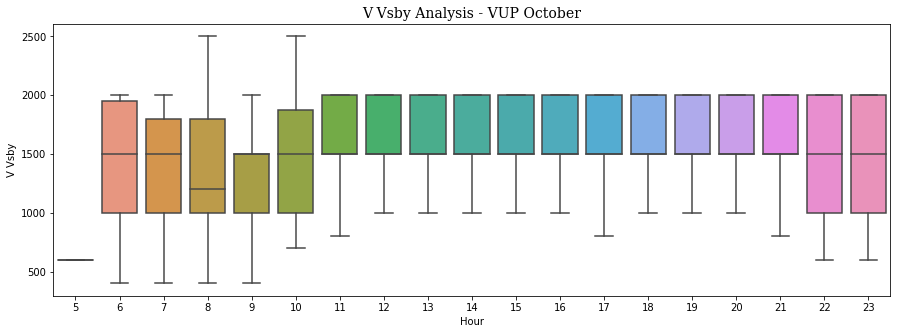

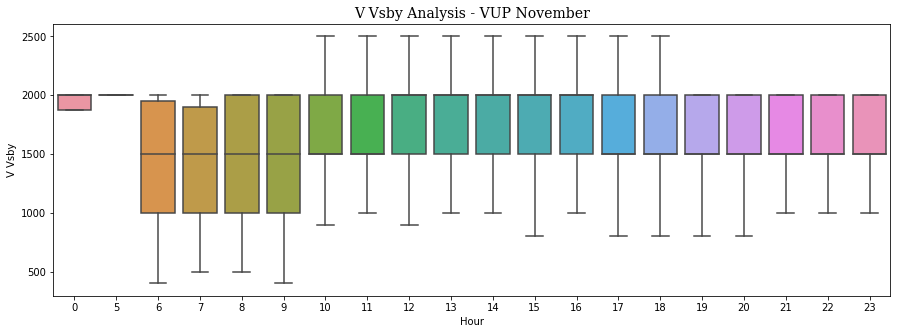

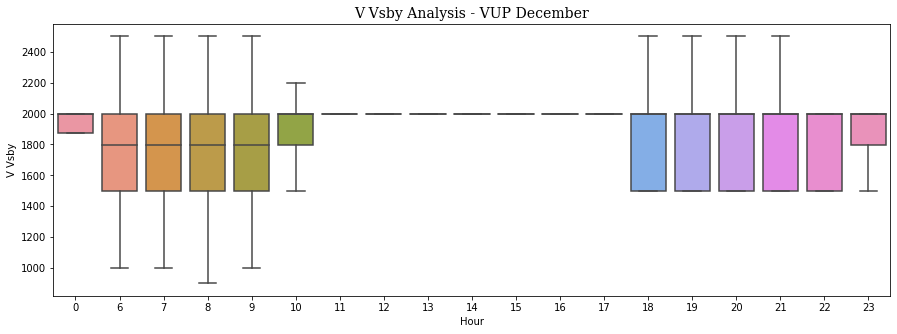

In [45]:
#Trend analysis and variability for each weather variable per Month and Hour by Airport

for i in request:
    
    dir2=str(dir)+"/"+str(i)
    
    for j in ['Temperature','Wind','H Vsby','V Vsby',]:
        
        for k,month in enumerate(['January','February','March','April','May','June','July','August','September','October','November','December']):
            
            dir3=str(dir2)+"/"+str(k)+". "+month
            
            aux=data[(data['IATA']==i)&(data['Month']==k+1)]
            plt.figure(figsize=(15,5))
            sns.boxplot(y=j,x='Hour',data=aux,showfliers = False)
            plt.title(j+' Analysis - '+i+' '+month,family="serif",fontsize=14)
            my_file=j+' Analysis - '+i+' '+month+'.png'
            
            plt.savefig(os.path.join(dir3, my_file))